In [1]:
'''
Description: To simulate eye diagram for pulse shaping filter.
Author: Hani Roshan CK
Date: 15/06/2023
'''

'\nDescription: To simulate eye diagram for pulse shaping filter.\nAuthor: Hani Roshan CK\nDate: 15/06/2023\n'

In [46]:
#Importing libraries
import imageio.v2 as imageio
import numpy as np
import matplotlib.pyplot as plt

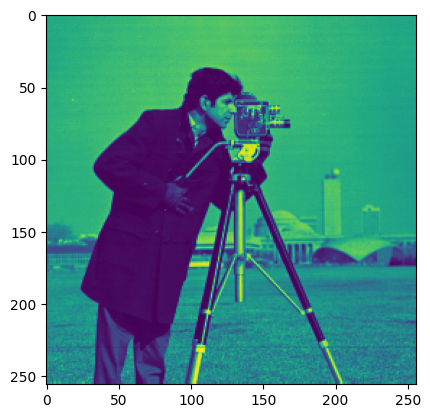

In [69]:
#Reading image
image = imageio.imread('Desktop/cameraman.png')
plt.imshow(image)
plt.show()

In [70]:
#Taking the pixel values and putting them in the form of an array
rearranged_image=np.reshape(image, (1,65536))
print(rearranged_image)

[[156 159 158 ... 133 130 113]]


In [71]:
#Converting each of the pixel values into bits and converting it into an array
binary_list=np.unpackbits(image)
binary_array=np.array(binary_list)

In [72]:
#Mapping 1 to 0 and 0 to -1
modified_list=[]
for i in range(len(binary_list)):
    if binary_list[i]==1:
        modified_list.append(1)
    else:
        modified_list.append(-1)
modified_array=np.array(modified_list)

In [73]:
#upsampling
L=4
upsampled=[]
for i in range(len(modified_array)):
    upsampled.append(float(modified_array[i]))
    for j in range(L-1):
        upsampled.append(float(0))

In [107]:
tsym=1
nsym=8
beta=0.6
impulse=[]
t=np.arange(-nsym/2, (nsym/2)+(1/L), 1/L)
for i in t:
    if i==0:
        p=(1/np.sqrt(tsym))*((1-beta)+(4*beta/np.pi))
    elif i==(tsym/4*beta) or i==-(tsym/4*beta):
        p=(beta/np.sqrt(2*tsym))*(((1+(2/np.pi))*np.sin(np.pi/(4*beta)))+((1-(2/np.pi))*np.cos(np.pi/(4*beta))))
    else:
        p=(1/np.sqrt(tsym))*(np.sin(np.pi*i*(1-beta)/tsym)+((4*beta*i/tsym)*np.cos(np.pi*i*(1+beta)/tsym)))/((np.pi*i*(1-(4*beta*i/tsym)**2))/tsym)
    impulse.append(p)

In [108]:
convolved=np.convolve(impulse, upsampled)

In [109]:
snr=0
sigma=np.sqrt(1/10**(snr/10))
num=len(convolved)
wgn=np.random.normal(0,sigma/np.sqrt(2),num)+1j*np.random.normal(0,sigma/np.sqrt(2),num)
recieved=convolved+wgn

In [110]:
impulse=np.flip(impulse)

In [111]:
convolved2=np.convolve(impulse, recieved)

In [112]:
downsampled=[]
temp=convolved2[len(impulse)-1:-(len(impulse)+1)]
i=0
while i<len(temp):
    downsampled.append(temp[i])
    i=i+4

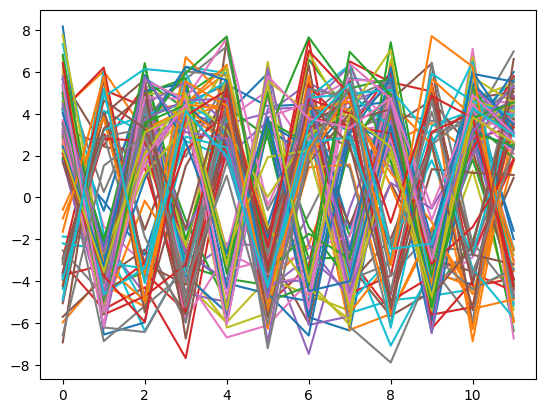

In [113]:
nsamples=3*L
ntraces=100
data=[]
k=0
for i in range(ntraces):
    temp=[]
    for j in range(nsamples):
        temp.append(downsampled[k])
        k=k+1
    data.append(temp)
for i in data:
    plt.plot(i)

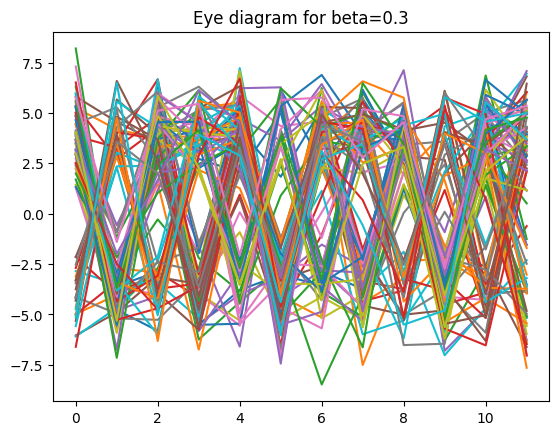

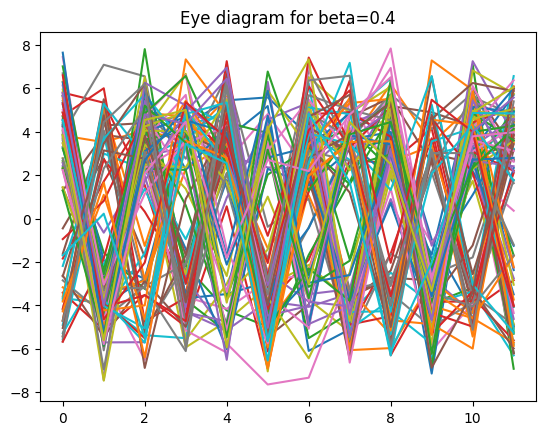

C:\Users\user\AppData\Local\Temp\ipykernel_19632\569964386.py:11: RuntimeWarning: divide by zero encountered in scalar divide
  p=(1/np.sqrt(tsym))*(np.sin(np.pi*i*(1-q)/tsym)+((4*q*i/tsym)*np.cos(np.pi*i*(1+q)/tsym)))/((np.pi*i*(1-(4*q*i/tsym)**2))/tsym)


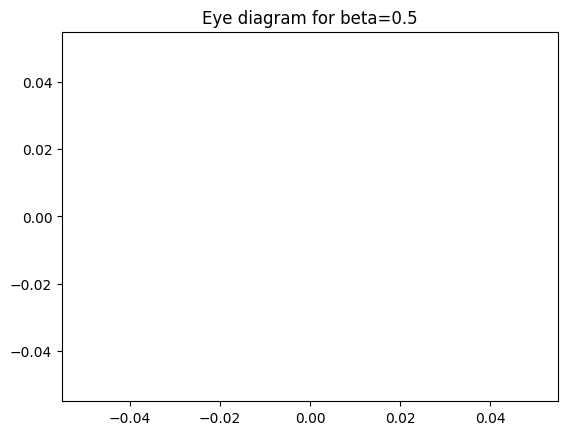

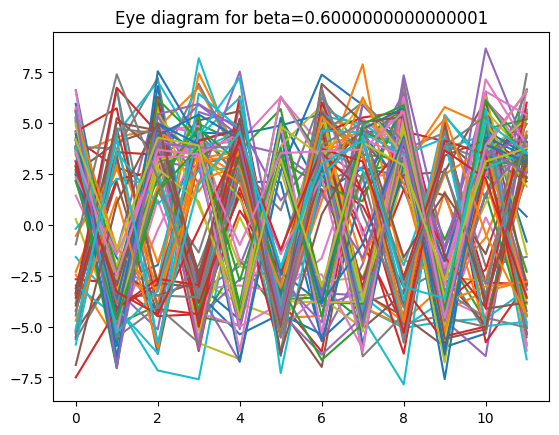

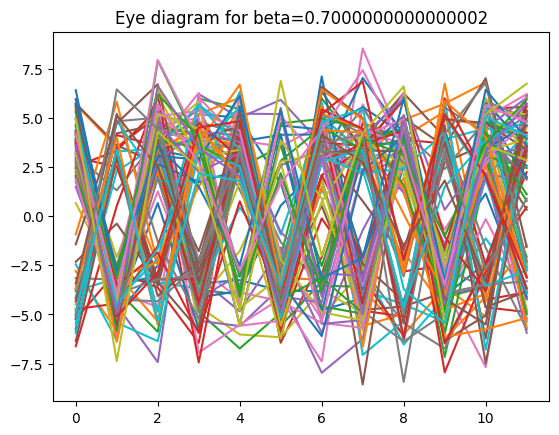

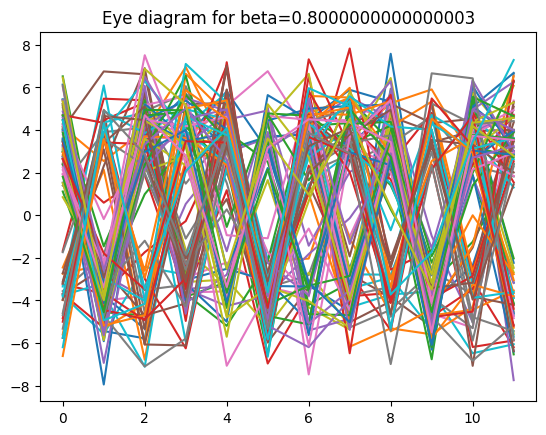

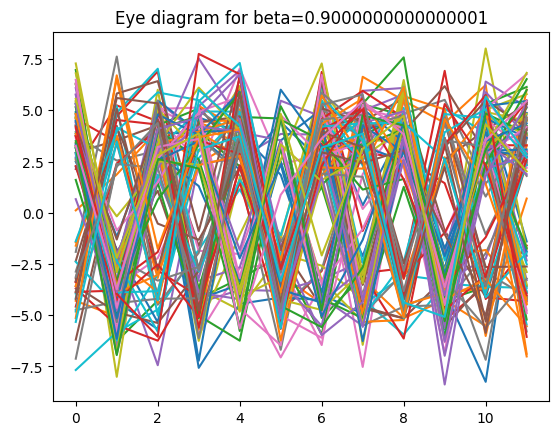

In [135]:
beta=np.arange(0.3,1,0.1)
t=np.arange(-nsym/2, (nsym/2)+(1/L), 1/L)
for q in beta:
    impulse=[]
    for i in t:
        if i==0:
            p=(1/np.sqrt(tsym))*((1-q)+(4*q/np.pi))
        elif i==(tsym/4*q) or i==-(tsym/4*q):
            p=(beta/np.sqrt(2*tsym))*(((1+(2/np.pi))*np.sin(np.pi/(4*q)))+((1-(2/np.pi))*np.cos(np.pi/(4*q))))
        else:
            p=(1/np.sqrt(tsym))*(np.sin(np.pi*i*(1-q)/tsym)+((4*q*i/tsym)*np.cos(np.pi*i*(1+q)/tsym)))/((np.pi*i*(1-(4*q*i/tsym)**2))/tsym)
        impulse.append(p)
    convolved=np.convolve(impulse, upsampled)
    snr=0
    sigma=np.sqrt(1/10**(snr/10))
    num=len(convolved)
    wgn=np.random.normal(0,sigma/np.sqrt(2),num)+1j*np.random.normal(0,sigma/np.sqrt(2),num)
    recieved=convolved+wgn
    impulse=np.flip(impulse)
    convolved2=np.convolve(impulse, recieved)
    downsampled=[]
    temp=convolved2[len(impulse)-1:-(len(impulse)+1)]
    i=0
    while i<len(temp):
        downsampled.append(temp[i])
        i=i+4
    nsamples=3*L
    ntraces=100
    data=[]
    k=0
    for i in range(ntraces):
        temp=[]
        for j in range(nsamples):
            temp.append(downsampled[k])
            k=k+1
        data.append(temp)
    for i in data:
        plt.plot(i)
    plt.title('Eye diagram for beta='+str(q))
    plt.show()

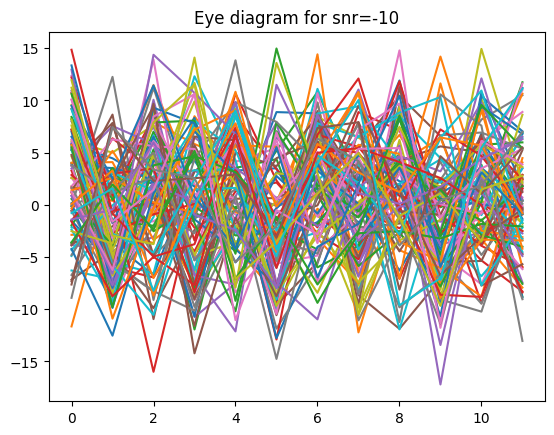

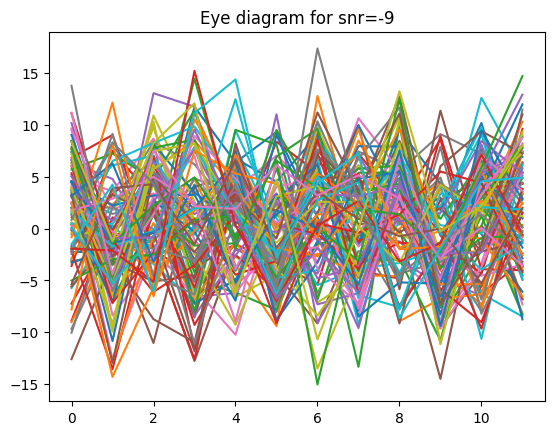

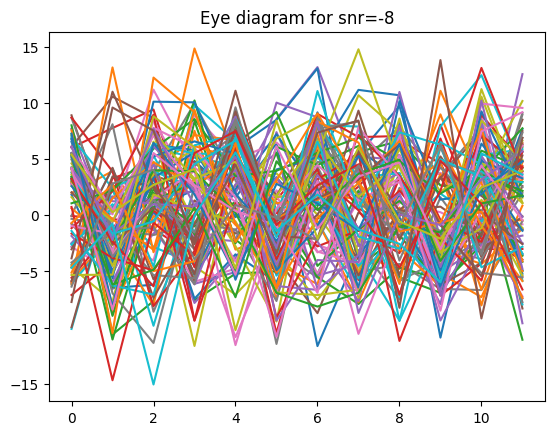

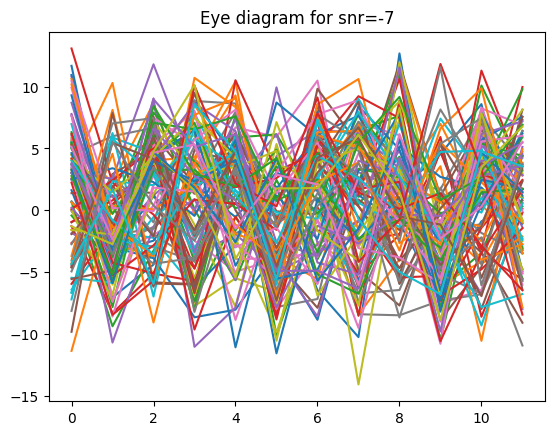

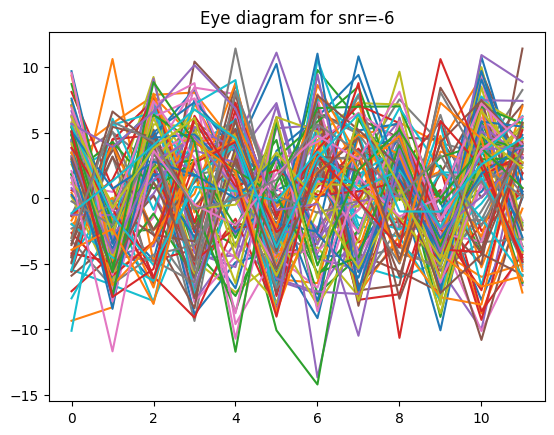

...

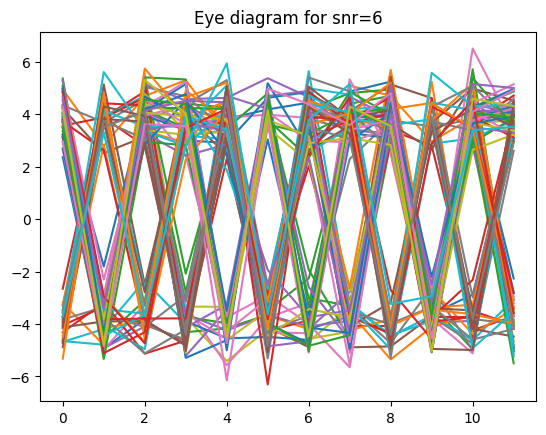

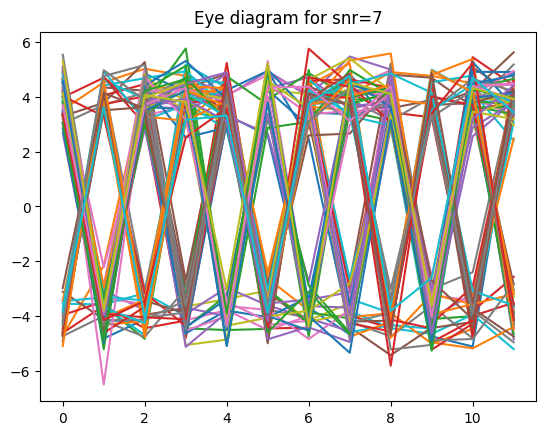

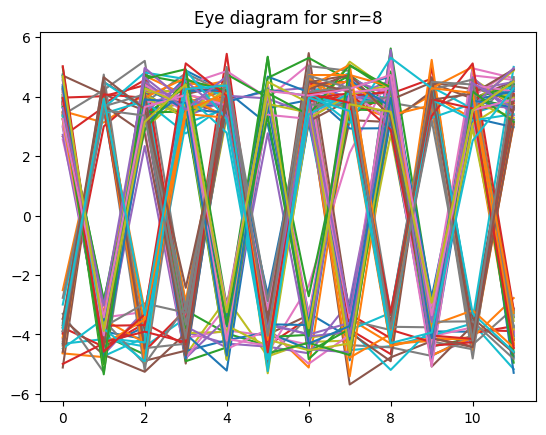

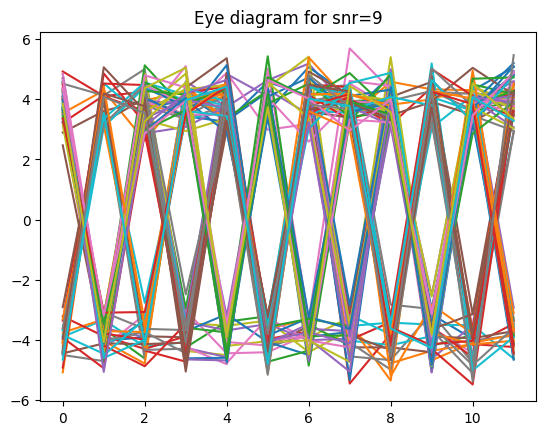

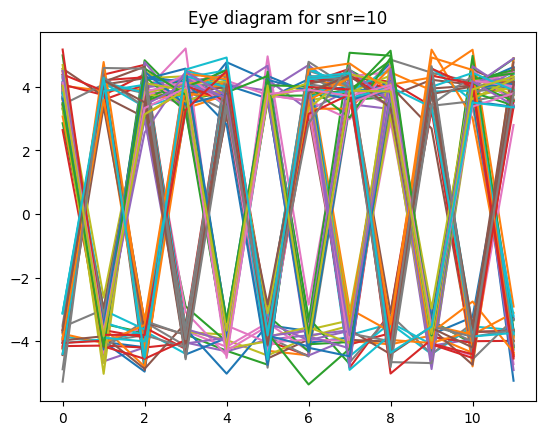

In [136]:
beta=0.6
t=np.arange(-nsym/2, (nsym/2)+(1/L), 1/L)
impulse=[]
for i in t:
    if i==0:
        p=(1/np.sqrt(tsym))*((1-beta)+(4*beta/np.pi))
    elif i==(tsym/4*beta) or i==-(tsym/4*beta):
        p=(beta/np.sqrt(2*tsym))*(((1+(2/np.pi))*np.sin(np.pi/(4*beta)))+((1-(2/np.pi))*np.cos(np.pi/(4*beta))))
    else:
        p=(1/np.sqrt(tsym))*(np.sin(np.pi*i*(1-beta)/tsym)+((4*beta*i/tsym)*np.cos(np.pi*i*(1+beta)/tsym)))/((np.pi*i*(1-(4*beta*i/tsym)**2))/tsym)
    impulse.append(p)
convolved=np.convolve(impulse, upsampled)
snr=np.arange(-10,11,1)
for q in snr:
    sigma=np.sqrt(1/10**(q/10))
    num=len(convolved)
    wgn=np.random.normal(0,sigma/np.sqrt(2),num)+1j*np.random.normal(0,sigma/np.sqrt(2),num)
    recieved=convolved+wgn
    impulse=np.flip(impulse)
    convolved2=np.convolve(impulse, recieved)
    downsampled=[]
    temp=convolved2[len(impulse)-1:-(len(impulse)+1)]
    i=0
    while i<len(temp):
        downsampled.append(temp[i])
        i=i+4
    nsamples=3*L
    ntraces=100
    data=[]
    k=0
    for i in range(ntraces):
        temp=[]
        for j in range(nsamples):
            temp.append(downsampled[k])
            k=k+1
        data.append(temp)
    for i in data:
        plt.plot(i)
    plt.title('Eye diagram for snr='+str(q))
    plt.show()